In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv(r'C:\Users\guptdraj\OneDrive - TietoEVRY\Desktop\Python notebook\movies.csv')

In [3]:
df.head(5)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
#Lets see if there is missing data

df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

<AxesSubplot:>

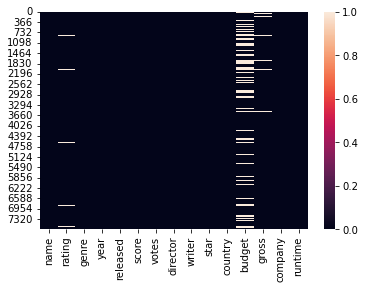

In [5]:
sns.heatmap(df.isnull())

In [6]:
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [7]:
df.fillna(df.mean(),inplace=True)

C:\Users\guptdraj\AppData\Local\Temp/ipykernel_8660/2085774198.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.fillna(df.mean(),inplace=True)


In [8]:
df = df.drop_duplicates()

In [9]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.400000,9.270000e+05,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,1.900000e+07,4.699877e+07,Warner Bros.,146.000000
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.800000,6.500000e+04,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4.500000e+06,5.885311e+07,Columbia Pictures,104.000000
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.700000,1.200000e+06,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,1.800000e+07,5.383751e+08,Lucasfilm,124.000000
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.700000,2.210000e+05,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3.500000e+06,8.345354e+07,Paramount Pictures,88.000000
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.300000,1.080000e+05,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6.000000e+06,3.984634e+07,Orion Pictures,98.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.100000,1.800000e+01,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7.000000e+03,7.850054e+07,NaN,90.000000
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.700000,3.600000e+01,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,3.558988e+07,7.850054e+07,Cactus Blue Entertainment,90.000000
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.700000,2.900000e+01,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,5.875000e+04,7.850054e+07,Embi Productions,107.261613
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",6.390411,8.810850e+04,James Randall,James Randall,Christina Roz,United States,1.500000e+04,7.850054e+07,NaN,120.000000


Can do a mode imputation for those null values. The function fillna() is handy for such operations.
Chaining of method .value_counts() in the code below. This returns the frequency distribution of each category in the feature, and then selecting the top category, which is the mode, with the .index attribute.

In [10]:
df2=df

In [11]:
df2['rating'] = df2['rating'].fillna(df2['rating'].value_counts().index[0])

<AxesSubplot:>

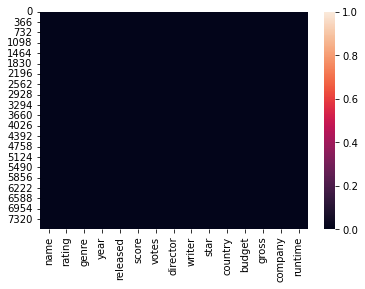

In [12]:
sns.heatmap(df2.isnull())

In [13]:
df2['budget'] = df2['budget'].astype('int64')
df2['gross'] = df2['gross'].astype('int64')

In [14]:
df2.dropna(inplace=True)

In [15]:
df2.isnull().values.sum()

0

In [16]:
df2['yearcorrect'] = df2['released'].str.extract(pat = '([0-9]{4})').astype(int)

In [17]:
df2

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.400000,9.270000e+05,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.000000,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.800000,6.500000e+04,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.000000,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.700000,1.200000e+06,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.000000,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.700000,2.210000e+05,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.000000,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.300000,1.080000e+05,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.000000,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7660,Aloha Surf Hotel,R,Comedy,2020,"November 5, 2020 (United States)",7.100000,1.400000e+01,Stefan C. Schaefer,Stefan C. Schaefer,Augie Tulba,United States,35589876,78500541,Abominable Pictures,90.000000,2020
7661,Love by Drowning,R,Drama,2020,"November 6, 2020 (United States)",6.390411,8.810850e+04,Justin Kreinbrink,C.E. Poverman,Nicky Whelan,United States,1000000,78500541,Dow Jazz Films,121.000000,2020
7664,Dream Round,R,Comedy,2020,"February 7, 2020 (United States)",4.700000,3.600000e+01,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,35589876,78500541,Cactus Blue Entertainment,90.000000,2020
7665,Saving Mbango,R,Drama,2020,"April 27, 2020 (Cameroon)",5.700000,2.900000e+01,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,78500541,Embi Productions,107.261613,2020


In [21]:
df2.sort_values(by=['gross'],ascending=False, inplace=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.800000,1.100000e+06,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.000000,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.400000,9.030000e+05,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.000000,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.800000,1.100000e+06,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.000000,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.800000,8.760000e+05,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.000000,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.400000,8.970000e+05,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.000000,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.900000,2.220000e+05,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.000000,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.000000,5.930000e+05,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.000000,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.000000,1.300000e+06,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.000000,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.100000,3.700000e+05,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.000000,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.800000,1.480000e+05,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.000000,2019


In [20]:
pd.set_option('display.max_rows',None)

In [24]:
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

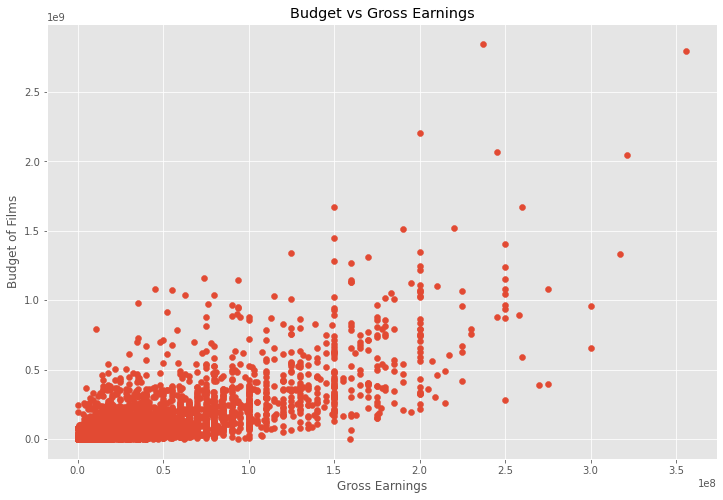

In [26]:
plt.scatter(x=df2['budget'],y=df2['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget of Films')
plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

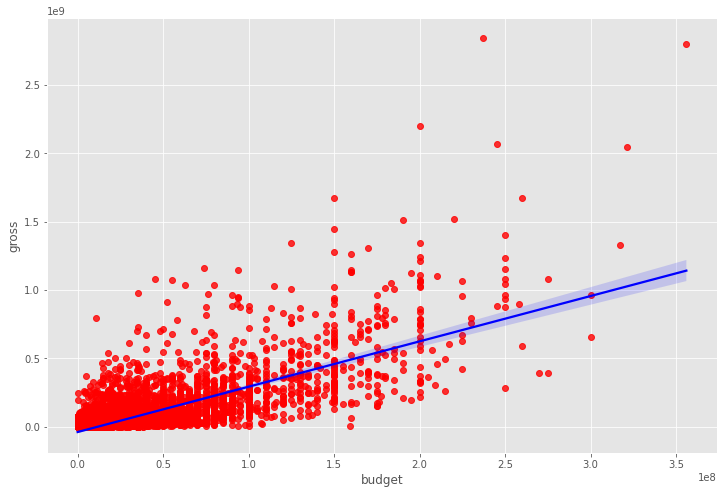

In [29]:
#Plot budget vs gross using seaborn

sns.regplot(x='budget',y='gross',data=df2,scatter_kws={"color":"red"},line_kws={"color":"blue"})

In [31]:
df2.corr(method='pearson') #pearson,kendall,spearman

,year,score,votes,budget,gross,runtime,yearcorrect
year,1.000000,0.097902,0.223077,0.266659,0.252283,0.119897,0.997404
score,0.097902,1.000000,0.409468,0.064230,0.182881,0.399905,0.105733
votes,0.223077,0.409468,1.000000,0.420950,0.628735,0.308888,0.218534
budget,0.266659,0.064230,0.420950,1.000000,0.711629,0.264982,0.260578
gross,0.252283,0.182881,0.628735,0.711629,1.000000,0.241287,0.245647
runtime,0.119897,0.399905,0.308888,0.264982,0.241287,1.000000,0.119703
yearcorrect,0.997404,0.105733,0.218534,0.260578,0.245647,0.119703,1.000000


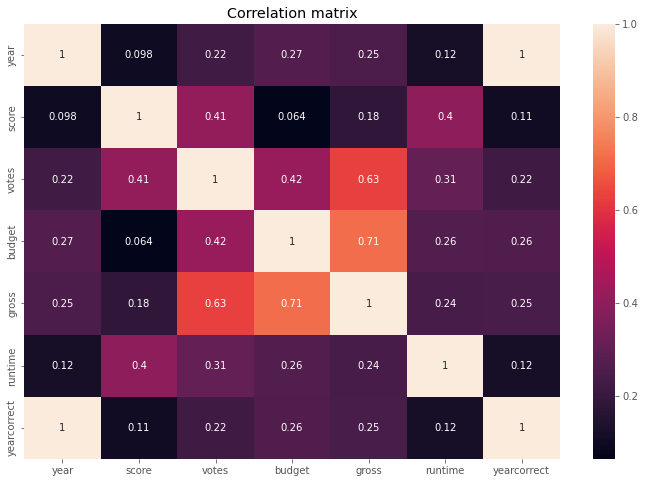

In [35]:
corr_matrix=df2.corr(method='pearson')

plt.title('Correlation matrix')
plt.xlabel('Movie feature')
plt.ylabel('Movie feature')
sns.heatmap(corr_matrix,annot=True)
plt.show()

In [39]:
df2_numerized = df2


for col_name in df2_numerized.columns:
    if(df2_numerized[col_name].dtype == 'object'):
        df2_numerized[col_name]= df2_numerized[col_name].astype('category')
        df2_numerized[col_name] = df2_numerized[col_name].cat.codes
        
df2_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,6569,6,6,1980,1702,8.400000,9.270000e+05,2579,4002,1041,54,19000000,46998772,2314,146.000000,1980
1,5558,6,1,1980,1489,5.800000,6.500000e+04,2262,1629,325,55,4500000,58853106,727,104.000000,1980
2,5129,4,0,1980,1768,8.700000,1.200000e+06,1109,2559,1737,55,18000000,538375067,1535,124.000000,1980
3,285,4,4,1980,1489,7.700000,2.210000e+05,1297,1995,2238,55,3500000,83453539,1807,88.000000,1980
4,1026,6,4,1980,1540,7.300000,1.080000e+05,1052,518,408,55,6000000,39846344,1772,98.000000,1980
5,2106,6,9,1980,2498,6.400000,1.230000e+05,2518,4349,240,55,550000,39754601,1807,95.000000,1980
6,5559,6,0,1980,1768,7.900000,1.880000e+05,1408,835,1270,55,27000000,115229890,2276,133.000000,1980
7,4424,6,3,1980,697,8.200000,3.300000e+05,1822,1766,2232,55,18000000,23402427,627,129.000000,1980
8,5266,4,0,1980,1750,6.800000,1.010000e+05,2297,1975,872,55,54000000,108185706,879,127.000000,1981
9,6196,6,3,1980,2282,7.000000,1.000000e+04,2852,420,584,55,10000000,15795189,2267,100.000000,1980


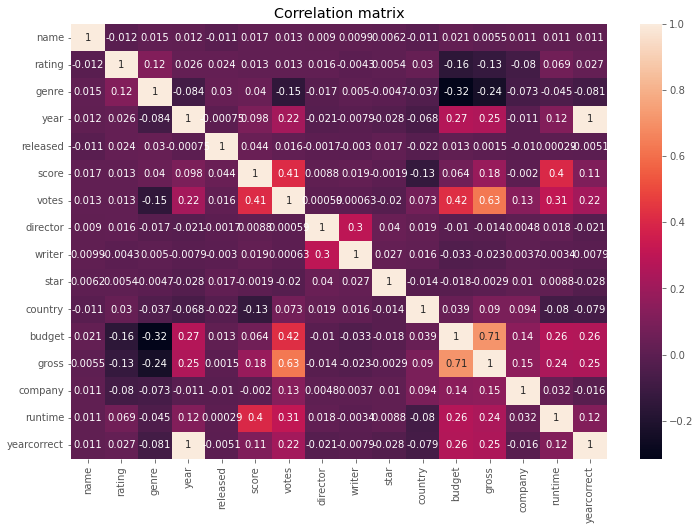

In [40]:
corr_matrix1=df2_numerized.corr(method='pearson')

plt.title('Correlation matrix')
plt.xlabel('Movie feature')
plt.ylabel('Movie feature')
sns.heatmap(corr_matrix1,annot=True)
plt.show()

In [42]:
correlation_matrix = df2_numerized.corr()

corr_pairs = correlation_matrix.unstack()
corr_pairs

name         name           1.000000
             rating        -0.012411
             genre          0.015234
             year           0.012005
             released      -0.010584
             score          0.016539
             votes          0.013204
             director       0.009005
             writer         0.009906
             star           0.006163
             country       -0.011015
             budget         0.020756
             gross          0.005513
             company        0.010525
             runtime        0.010653
             yearcorrect    0.011406
rating       name          -0.012411
             rating         1.000000
             genre          0.120834
             year           0.026448
             released       0.024491
             score          0.013359
             votes          0.013377
             director       0.016102
             writer        -0.004336
             star           0.005366
             country        0.030176
 

In [45]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre        budget        -0.315875
budget       genre         -0.315875
genre        gross         -0.237839
gross        genre         -0.237839
rating       budget        -0.156938
budget       rating        -0.156938
votes        genre         -0.150176
genre        votes         -0.150176
country      score         -0.133201
score        country       -0.133201
gross        rating        -0.130502
rating       gross         -0.130502
year         genre         -0.084395
genre        year          -0.084395
yearcorrect  genre         -0.080633
genre        yearcorrect   -0.080633
rating       company       -0.080379
company      rating        -0.080379
country      runtime       -0.079977
runtime      country       -0.079977
country      yearcorrect   -0.078785
yearcorrect  country       -0.078785
genre        company       -0.072904
company      genre         -0.072904
year         country       -0.068140
country      year          -0.068140
genre        runtime       -0.044986
r

In [46]:
high_corr = sorted_pairs[sorted_pairs>0.5]
high_corr

votes        gross          0.628735
gross        votes          0.628735
             budget         0.711629
budget       gross          0.711629
year         yearcorrect    0.997404
yearcorrect  year           0.997404
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

__Budget and Votes have high correlation__

__Company has low correlation__